## Building an Emoji Classifier ##

## RESULTS / DISCUSSION ##

### ***other discussions are within the respective tasks ###

## Task 4 - Accuracy performance on test set run on 300d Word2vec is better than 300d Glove with accuracies 80.36% and 78.57% respectively##

## Task 5 - Trained on Wikipedia - 200d GloVe embeddings perform better with evaluation accuracy of 83.87%, followed by 100d GloVe embedding with 74.19%, and 50d GloVe embedding with 67.74%##

## Task 5 - Trained on Twitter - 200d GloVe embeddings and 50d GloVe embedding perform better with the same evaluation accuracy of 80.65%, followed by 100d GloVe embedding with 74.19% ##

## Task 5 - Between the 2 sets ( Wikipedia versus Twitter ) - 50d GloVe embedding trained on Twitter is better than 50d GloVe embedding trained on Wikipedia with 80.65% and 67.74% respectively##

## Task 5 - Between the 2 sets ( Wikipedia versus Twitter ) - 200d GloVe embedding trained on Wikipedia is better than 200d GloVe embedding trained on Twitter with 83.87% and 80.65% respectively##

## Task 5 - Between the 2 sets ( Wikipedia versus Twitter ) - 100d GloVe embedding trained on Twitter and 100d GloVe embedding trained on Wikipedia  perform the same with 74.19%##

### Note: please and '259 vector_size' to the first line of all the glove .txt file ###

In [3]:
# Necessary imports
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
from matplotlib import pyplot

In [4]:
from gensim.models import Word2Vec, KeyedVectors
import pandas as pd
import numpy as np
import nltk

## Data Processing ##

In [5]:
training_data = pd.read_csv('data/train_emoji.csv', names=['sentences', 'emojis'])

In [6]:
test_data = pd.read_csv('data/test_emoji.csv', names=['sentences', 'emojis'])
#test_data = pd.read_csv('data/test_emoji.csv')

In [567]:
testing_dataset = pd.read_csv('data/test_emoji.csv', names=['sentences', 'emojis'])

In [7]:
training_data.head(10)

,sentences,emojis
0,never talk to me again,3
1,I am proud of your achievements,2
2,It is the worst day in my life,3
3,Miss you so much,0
4,food is life,4
5,I love you mum,0
6,Stop saying bullshit,3
7,congratulations on your acceptance,2
8,The assignment is too long,3
9,I want to go play,1


In [8]:
test_data.head(10)

,sentences,emojis
0,I want to eat\t,4
1,he did not answer\t,3
2,he got a very nice raise\t,2
3,she got me a nice present\t,2
4,ha ha ha it was so funny\t,2
5,he is a good friend\t,2
6,I am upset\t,3
7,We had such a lovely dinner tonight\t,2
8,where is the food\t,4
9,Stop making this joke ha ha ha\t,2


In [9]:
#nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     /home/demolakstate/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [389]:
test_sentences = test_data['sentences'].str.lower().values

In [390]:
test_sentences[0]

'i want to eat\t'

In [10]:
sentences = training_data['sentences'].str.lower().values

In [387]:
test_label = test_data['emojis'].values

In [388]:
test_label.shape

(56,)

In [120]:
training_label = training_data['emojis'].values

In [179]:
training_label.shape

(132,)

In [94]:
#training_label = training_label.reshape(132, -1)

In [122]:
training_label.shape

(132,)

In [184]:
sentences[0]

'never talk to me again'

In [11]:
# las 10
sentences[-10:]

array(['he is handsome', 'too bad that you were not here',
       'you are a loser', 'i love indian food',
       'who is down for a restaurant', 'he had to make a home run',
       'i am ordering food', 'what is wrong with you', 'i love you',
       'great job'], dtype=object)

In [438]:
test_sentenceVec = [nltk.word_tokenize(sentence) for sentence in test_sentences]

In [12]:
sentenceVec = [nltk.word_tokenize(sentence) for sentence in sentences]

In [439]:
test_sentenceVec

[['i', 'want', 'to', 'eat'],
 ['he', 'did', 'not', 'answer'],
 ['he', 'got', 'a', 'very', 'nice', 'raise'],
 ['she', 'got', 'me', 'a', 'nice', 'present'],
 ['ha', 'ha', 'ha', 'it', 'was', 'so', 'funny'],
 ['he', 'is', 'a', 'good', 'friend'],
 ['i', 'am', 'upset'],
 ['we', 'had', 'such', 'a', 'lovely', 'dinner', 'tonight'],
 ['where', 'is', 'the', 'food'],
 ['stop', 'making', 'this', 'joke', 'ha', 'ha', 'ha'],
 ['where', 'is', 'the', 'ball'],
 ['work', 'is', 'hard'],
 ['this', 'girl', 'is', 'messing', 'with', 'me'],
 ['are', 'you', 'serious'],
 ['let', 'us', 'go', 'play', 'baseball'],
 ['this', 'stupid', 'grader', 'is', 'not', 'working'],
 ['work', 'is', 'horrible'],
 ['congratulation', 'for', 'having', 'a', 'baby'],
 ['stop', 'pissing', 'me', 'off'],
 ['any', 'suggestions', 'for', 'dinner'],
 ['i', 'love', 'taking', 'breaks'],
 ['you', 'brighten', 'my', 'day'],
 ['i', 'boiled', 'rice'],
 ['she', 'is', 'a', 'bully'],
 ['why', 'are', 'you', 'feeling', 'bad'],
 ['i', 'am', 'upset'],
 ['gi

In [13]:
sentenceVec

[['never', 'talk', 'to', 'me', 'again'],
 ['i', 'am', 'proud', 'of', 'your', 'achievements'],
 ['it', 'is', 'the', 'worst', 'day', 'in', 'my', 'life'],
 ['miss', 'you', 'so', 'much'],
 ['food', 'is', 'life'],
 ['i', 'love', 'you', 'mum'],
 ['stop', 'saying', 'bullshit'],
 ['congratulations', 'on', 'your', 'acceptance'],
 ['the', 'assignment', 'is', 'too', 'long'],
 ['i', 'want', 'to', 'go', 'play'],
 ['she', 'did', 'not', 'answer', 'my', 'text'],
 ['your', 'stupidity', 'has', 'no', 'limit'],
 ['how', 'many', 'points', 'did', 'he', 'score'],
 ['my', 'algorithm', 'performs', 'poorly'],
 ['i', 'got', 'approved'],
 ['stop', 'shouting', 'at', 'me'],
 ['sounds', 'like', 'a', 'fun', 'plan', 'ha', 'ha'],
 ['no', 'one', 'likes', 'him'],
 ['the', 'game', 'just', 'finished'],
 ['i', 'will', 'celebrate', 'soon'],
 ['so', 'sad', 'you', 'are', 'not', 'coming'],
 ['she', 'is', 'my', 'dearest', 'love'],
 ['good', 'job'],
 ['it', 'was', 'funny', 'lol'],
 ['candy', 'is', 'life'],
 ['the', 'chicago', 'cu

In [440]:
len(test_sentenceVec)

56

In [136]:
len(sentenceVec)

132

## Task 2 ##

### 50d GloVe embedding trained on Twitter ###

In [ ]:
# This is model_7 - already trained in Task 5, just being used here

In [545]:
model_7_2 = Word2Vec(size=50, min_count=1)
model_7_2.build_vocab(sentenceVec)
total_examples = model_7_2.corpus_count
model = KeyedVectors.load_word2vec_format("glove.twitter.27B/glove.twitter.27B.50d.txt", binary=False)
model_7_2.build_vocab([list(model.vocab.keys())], update=True)
model_7_2.intersect_word2vec_format("glove.twitter.27B/glove.twitter.27B.50d.txt", binary=False, lockf=1.0)
model_7_2.train(sentenceVec, total_examples=total_examples, epochs=model_7_2.iter)


/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:7: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).
  import sys


(2550, 3125)

In [546]:
model_7_2.wv.vectors.shape

(443, 50)

In [547]:
x_train = x_data(sentenceVec, model_7_2)

In [548]:
avg_train = dict()
for i, x_t in enumerate(x_train):
    avg_train[i] = []
    avg_train[i].append(np.mean(x_t, axis=0))

In [549]:
avg_train_2 = list()
for x in avg_train.values():
    avg_train_2.append(x[0])

In [550]:
data = np.array(avg_train_2)

In [551]:
x_train, x_test, y_train, y_test = train_test_split(data, training_label, test_size=0.23, random_state=2)

In [552]:
logisticRegr.fit(x_train, y_train)

/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [553]:
score = logisticRegr.score(x_test, y_test)
print(score)

0.8064516129032258


In [554]:
predictions = logisticRegr.predict(x_test)

In [555]:
cm = metrics.confusion_matrix(y_test, predictions)

In [556]:
# Confusion Matrix

print(cm)

[[5 0 0 0 0]
 [0 4 0 0 0]
 [1 0 4 2 1]
 [0 0 2 9 0]
 [0 0 0 0 3]]


## Heat Map for Confusion Matrix ##

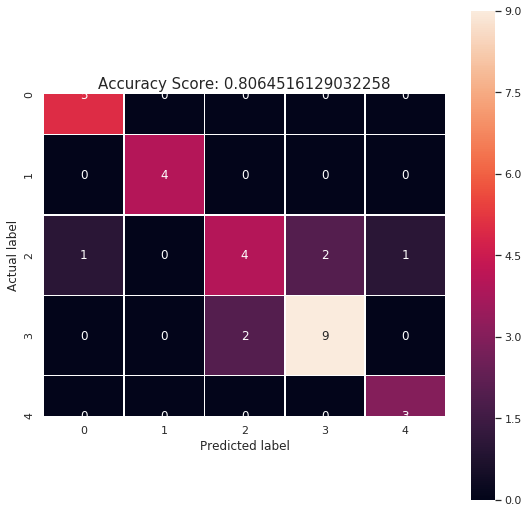

In [557]:
plt.figure(figsize=(9,9))
#sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')

#sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True)
sns.heatmap(cm, annot=True, linewidths=.5, square = True)

#sns.heatmap(cm, annot=True)
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15);

## Accuracy on the test set ##

In [559]:
model_7_2_test = Word2Vec(size=50, min_count=1)
model_7_2_test.build_vocab(test_sentenceVec)
total_examples = model_7_2_test.corpus_count
model = KeyedVectors.load_word2vec_format("glove.twitter.27B/glove.twitter.27B.50d.txt", binary=False)
model_7_2_test.build_vocab([list(model.vocab.keys())], update=True)
model_7_2_test.intersect_word2vec_format("glove.twitter.27B/glove.twitter.27B.50d.txt", binary=False, lockf=1.0)
model_7_2_test.train(sentenceVec, total_examples=total_examples, epochs=model_7_2.iter)


/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:7: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).
  import sys


(1665, 3125)

In [560]:
x_test = x_data(test_sentenceVec, model_7_2_test)

In [561]:
avg_test = dict()
for i, x_t in enumerate(x_test):
    avg_test[i] = []
    avg_test[i].append(np.mean(x_t, axis=0))

In [562]:
avg_test_2 = list()
for x in avg_test.values():
    avg_test_2.append(x[0])

In [563]:
test_data = np.array(avg_test_2)

In [564]:
score_test = logisticRegr.score(test_data, test_label)

In [565]:
print(score_test)

0.7857142857142857


## Test dataset Performance Accuracy of 50d GloVe trained on Twitter = 0.7857142857142857  ##

In [568]:
testing_dataset.head(20)

,sentences,emojis
0,I want to eat\t,4
1,he did not answer\t,3
2,he got a very nice raise\t,2
3,she got me a nice present\t,2
4,ha ha ha it was so funny\t,2
5,he is a good friend\t,2
6,I am upset\t,3
7,We had such a lovely dinner tonight\t,2
8,where is the food\t,4
9,Stop making this joke ha ha ha\t,2


In [569]:
predictions = logisticRegr.predict(test_data)

## 10 examples of correctly classified and 10 examples of wrongly classified ##

In [570]:
predictions

array([4, 3, 2, 0, 2, 2, 3, 2, 4, 2, 1, 2, 3, 3, 1, 3, 2, 0, 3, 4, 0, 0,
       4, 0, 3, 3, 1, 0, 1, 2, 0, 1, 2, 3, 3, 2, 0, 4, 4, 3, 1, 0, 0, 1,
       2, 0, 2, 2, 3, 3, 3, 0, 3, 2, 2, 4])

In [572]:
index = 0
classifiedIndex = []
for predict, actual in zip(predictions, y_test):
    if predict==actual:
        print("Correctly classified - Test data Index: {}, Predicted: {}, Actual: {}".format(index, predict, actual))
        classifiedIndex.append(index)
    else:
        print("Wrongly classified - Test data Index: {}, Predicted: {}, Actual: {}".format(index, predict, actual))
    index +=1
    

Wrongly classified - Test data Index: 0, Predicted: 4, Actual: 3
Wrongly classified - Test data Index: 1, Predicted: 3, Actual: 2
Wrongly classified - Test data Index: 2, Predicted: 2, Actual: 1
Correctly classified - Test data Index: 3, Predicted: 0, Actual: 0
Wrongly classified - Test data Index: 4, Predicted: 2, Actual: 0
Correctly classified - Test data Index: 5, Predicted: 2, Actual: 2
Correctly classified - Test data Index: 6, Predicted: 3, Actual: 3
Correctly classified - Test data Index: 7, Predicted: 2, Actual: 2
Wrongly classified - Test data Index: 8, Predicted: 4, Actual: 0
Wrongly classified - Test data Index: 9, Predicted: 2, Actual: 0
Wrongly classified - Test data Index: 10, Predicted: 1, Actual: 3
Wrongly classified - Test data Index: 11, Predicted: 2, Actual: 4
Wrongly classified - Test data Index: 12, Predicted: 3, Actual: 2
Wrongly classified - Test data Index: 13, Predicted: 3, Actual: 4
Wrongly classified - Test data Index: 14, Predicted: 1, Actual: 3
Wrongly clas

### Are the results surprising?  yes ###

### Explanation of misclassifications - Going by the fact that we have many more wrongly classified than correctly classified, I expect the accuracy to be much lower than 78%. Atleast something less than 50%###

## Task 3 ##

In [601]:
x_train = x_data(sentenceVec, model_7_2)

In [602]:
min_train = dict()
for i, x_t in enumerate(x_train):
    min_train[i] = []
    min_train[i].append(np.amin(x_t, axis=0))

In [603]:
min_train

{0: [array([ 0.12012281,  0.05478658, -0.3953459 , -0.544359  , -0.54962265,
         -0.18417066, -0.15817945, -0.21674883, -0.05302335, -1.4890156 ,
         -0.8288928 , -0.68595505, -6.3758593 , -1.5351387 , -1.2543544 ,
         -0.19014005, -0.6232759 , -0.5544253 , -1.1482972 , -0.7684906 ,
         -0.20131381, -0.10774548, -0.2789232 ,  0.30746928, -0.34745997,
         -2.9049184 , -0.46129015, -0.3831195 , -0.58810925, -0.54168975,
         -0.65486133, -0.25027913, -0.40856817, -0.21880545, -0.66855556,
         -0.05263255, -0.02469703, -0.785155  , -0.90021604, -0.13832788,
         -1.8729452 ,  0.15646517, -0.19108157, -0.6571835 ,  0.0123757 ,
         -0.8665504 , -0.81469226, -0.1935577 , -0.25118378, -0.13661194],
        dtype=float32)],
 1: [array([-0.11276323, -0.31221354, -0.19763897, -0.20218053, -0.6600834 ,
         -0.31020972,  0.15141317, -0.719317  , -0.8178673 , -0.6886026 ,
         -1.0218003 , -0.5623274 , -6.3999376 , -0.29462987, -0.91432077,
      

In [604]:
min_train_2 = list()
for x in min_train.values():
    min_train_2.append(x[0])

In [605]:
training_dataset_min = np.array(min_train_2)

In [578]:
x_train, x_eval, y_train, y_eval = train_test_split(training_dataset, training_label, test_size=0.23, random_state=2)

In [579]:
logisticRegr.fit(x_train, y_train)

/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [580]:
score = logisticRegr.score(x_eval, y_eval)
print(score)

0.7096774193548387


## Evaluation Accuracy of 50d GloVe embedding trained on Twitter using "MIN" of sentence = 0.7096774193548387  ##

In [606]:
x_training = x_data(sentenceVec, model_7_2)

In [607]:
max_train = dict()
for i, x_t in enumerate(x_training):
    max_train[i] = []
    max_train[i].append(np.amax(x_t, axis=0))

In [608]:
max_train_2 = list()
for x in max_train.values():
    max_train_2.append(x[0])

In [609]:
training_dataset_max = np.array(max_train_2)

In [585]:
x_train, x_eval, y_train, y_eval = train_test_split(training_dataset, training_label, test_size=0.23, random_state=2)

In [586]:
logisticRegr.fit(x_train, y_train)

/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [587]:
score = logisticRegr.score(x_eval, y_eval)
print(score)

0.6774193548387096


## Evaluation Accuracy of 50d GloVe embedding trained on Twitter using "MAX" of sentence = 0.6774193548387096 ##

In [610]:
x_training = x_data(sentenceVec, model_7_2)

In [611]:
average_train = dict()
for i, x_t in enumerate(x_training):
    average_train[i] = []
    average_train[i].append(np.mean(x_t, axis=0))

In [612]:
average_train_2 = list()
for x in average_train.values():
    average_train_2.append(x[0])

In [613]:
training_dataset_avg = np.array(average_train_2)

In [600]:
training_dataset.shape

(132, 50)

In [592]:
x_train, x_eval, y_train, y_eval = train_test_split(training_dataset, training_label, test_size=0.23, random_state=2)

In [593]:
logisticRegr.fit(x_train, y_train)

/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [594]:
score = logisticRegr.score(x_eval, y_eval)
print(score)

0.8064516129032258


## Evaluation Accuracy of 50d GloVe embedding trained on Twitter using "AVERAGE" of sentence = 0.8064516129032258 ##

## The representation with "AVERAGE" of sentences gives the best result with 80.65% evaluation accuracy ##

In [614]:
training_dataset_avg_min_max = np.concatenate((training_dataset_avg, training_dataset_min, training_dataset_max), axis=1)

In [615]:
training_dataset_avg_min_max.shape

(132, 150)

In [616]:
x_train, x_eval, y_train, y_eval = train_test_split(training_dataset_avg_min_max, training_label, test_size=0.23, random_state=2)

In [617]:
logisticRegr.fit(x_train, y_train)

/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [618]:
score = logisticRegr.score(x_eval, y_eval)
print(score)

0.7741935483870968


## Evaluation Accuracy of 50d GloVe embedding trained on Twitter using "AVERAGE", "MIN" and "MAX" of sentence = 0.7741935483870968 ##

### The result is better than that obtained from max and min, but "average" only is still the best ###

## Task 4 ##

## Train the model ##

In [441]:
model_1_test = Word2Vec(test_sentenceVec, size=300, min_count=1)

In [16]:
model_1 = Word2Vec(sentenceVec, size=300, min_count=1)

In [442]:
print(model_1_test)

Word2Vec(vocab=129, size=300, alpha=0.025)


In [17]:
print(model_1)

Word2Vec(vocab=259, size=300, alpha=0.025)


/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:5: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """


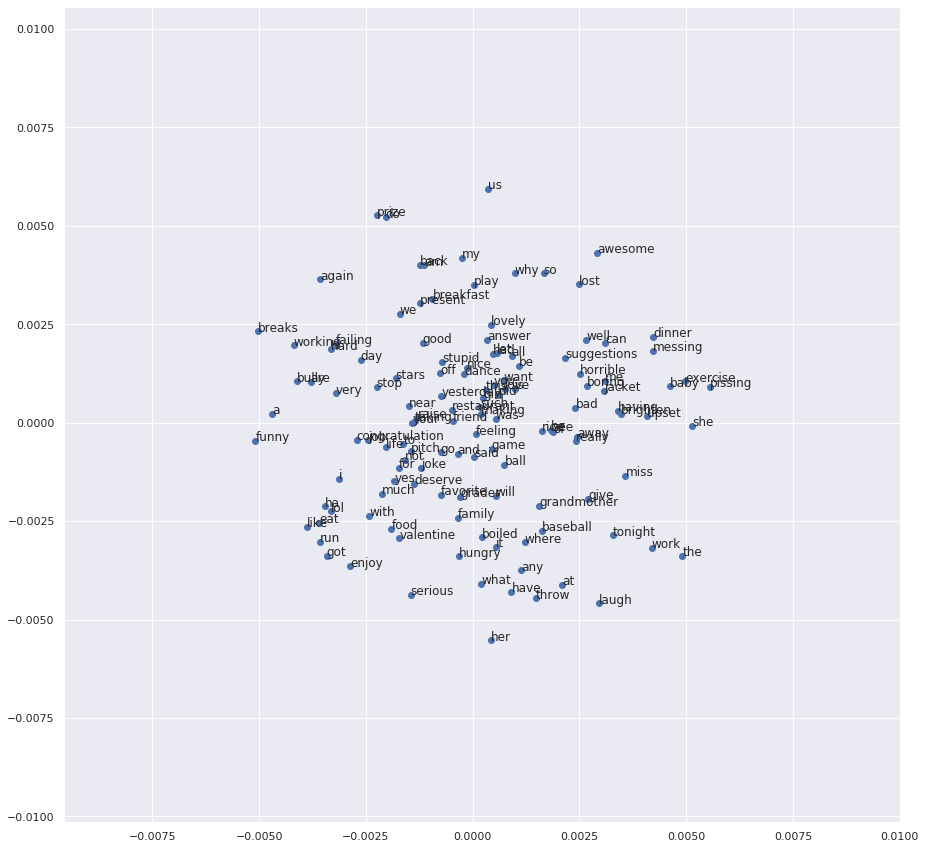

In [443]:
# plot the pca of untrained model

pyplot.figure(figsize=(15,15))
# fit a 2d PCA model to the vectors
X = model_1_test[model_1_test.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)
# create a scatter plot of the projection
pyplot.scatter(result[:, 0], result[:, 1])
words = list(model_1_test.wv.vocab)
for i, word in enumerate(words):
    pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:5: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """


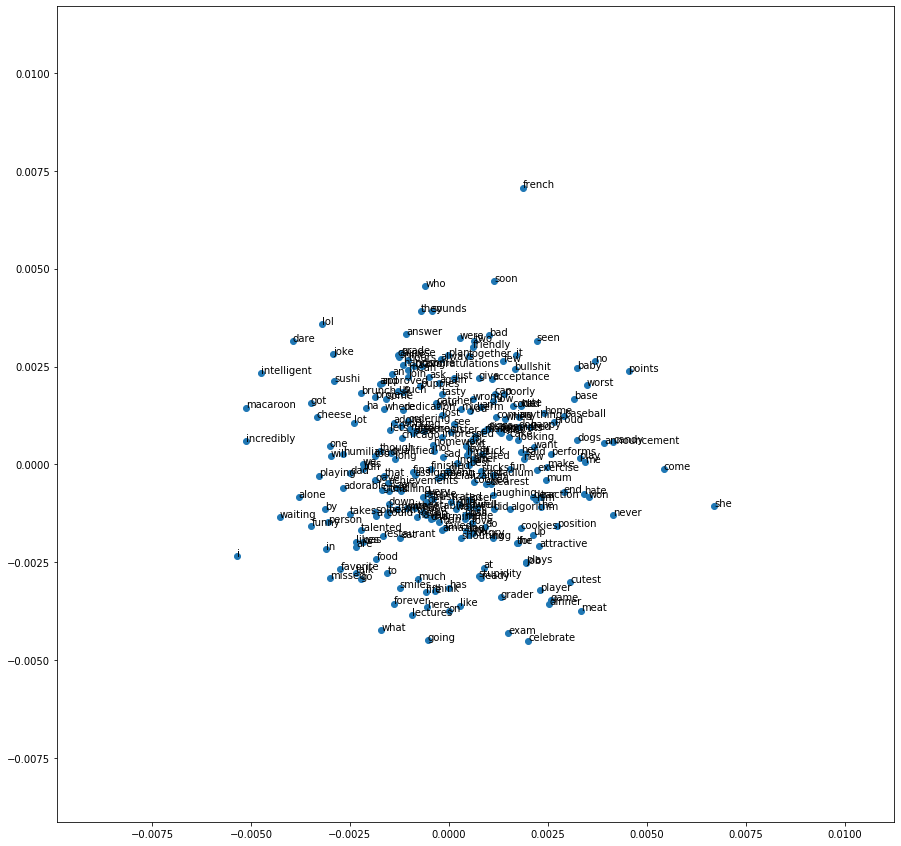

In [18]:
# plot the pca of untrained model

pyplot.figure(figsize=(15,15))
# fit a 2d PCA model to the vectors
X = model_1[model_1.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)
# create a scatter plot of the projection
pyplot.scatter(result[:, 0], result[:, 1])
words = list(model_1.wv.vocab)
for i, word in enumerate(words):
    pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

## Load pre-trained word embedding on Word2vec on GoogleNews-vectors-negative300.bin ##

In [444]:
from gensim.models import KeyedVectors

model_2_test = Word2Vec(size=300, min_count=1)
model_2_test.build_vocab(test_sentenceVec)
total_examples = model_2_test.corpus_count
model = KeyedVectors.load_word2vec_format("GoogleNews-vectors-negative300.bin", binary=True)
#model = KeyedVectors.load_word2vec_format("glove.6B.300d.txt", binary=False)

model_2_test.build_vocab([list(model.vocab.keys())], update=True)
model_2_test.intersect_word2vec_format("GoogleNews-vectors-negative300.bin", binary=True, lockf=1.0)
#model_2.intersect_word2vec_format("glove.6B.300d.txt", binary=False, lockf=1.0)
model_2_test.train(test_sentenceVec, total_examples=total_examples, epochs=model_2.iter)



/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:12: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).
  if sys.path[0] == '':


(1204, 1240)

In [183]:
from gensim.models import KeyedVectors

model_2 = Word2Vec(size=300, min_count=1)
model_2.build_vocab(sentenceVec)
total_examples = model_2.corpus_count
model = KeyedVectors.load_word2vec_format("GoogleNews-vectors-negative300.bin", binary=True)
#model = KeyedVectors.load_word2vec_format("glove.6B.300d.txt", binary=False)

model_2.build_vocab([list(model.vocab.keys())], update=True)
model_2.intersect_word2vec_format("GoogleNews-vectors-negative300.bin", binary=True, lockf=1.0)
#model_2.intersect_word2vec_format("glove.6B.300d.txt", binary=False, lockf=1.0)
model_2.train(sentenceVec, total_examples=total_examples, epochs=model_2.iter)



/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:12: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).
  if sys.path[0] == '':


(3027, 3125)

/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


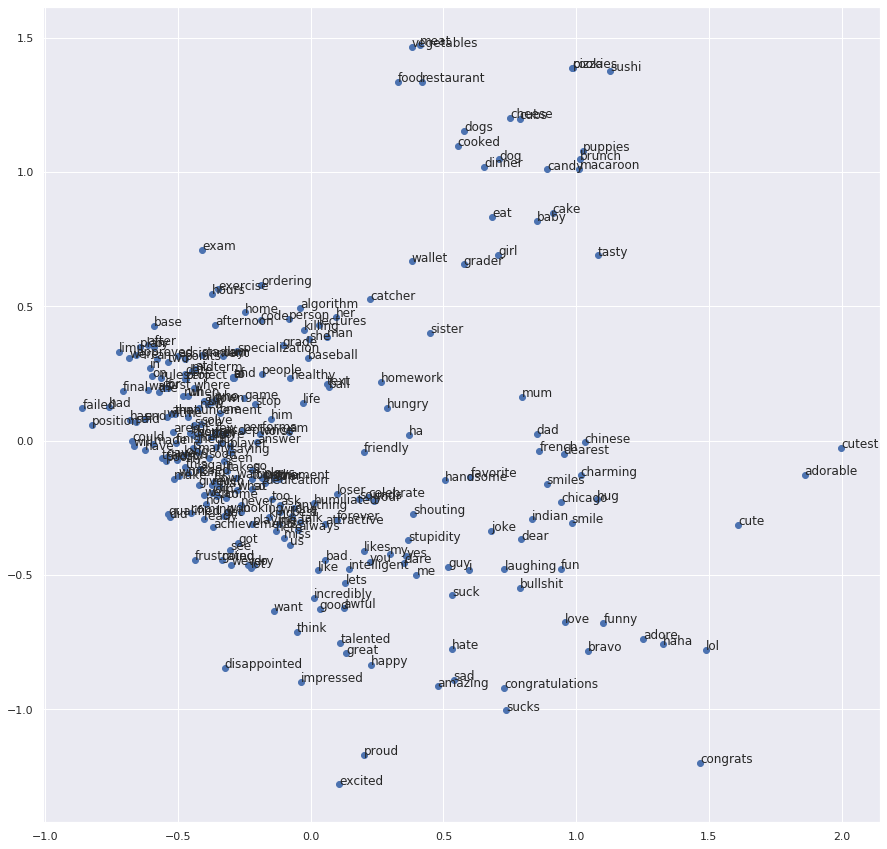

In [445]:
pyplot.figure(figsize=(15,15))
# fit a 2d PCA model to the vectors
X = model_2_test[model_1.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)
# create a scatter plot of the projection
pyplot.scatter(result[:, 0], result[:, 1])
words = list(model_1.wv.vocab)
for i, word in enumerate(words):
    pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


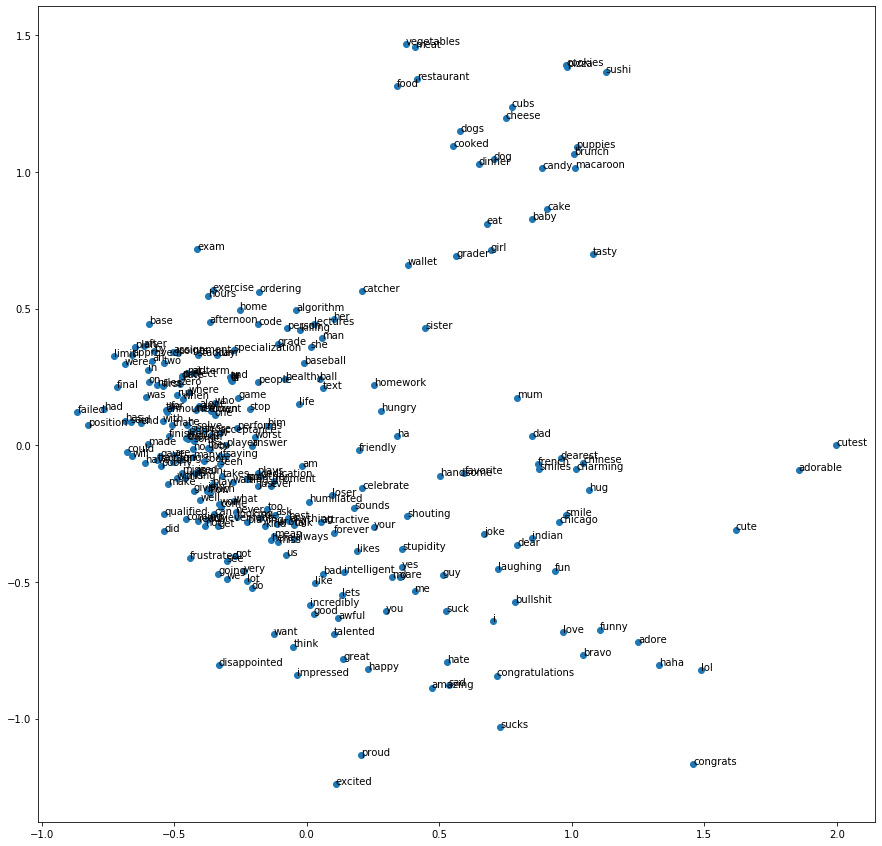

In [94]:

pyplot.figure(figsize=(15,15))
# fit a 2d PCA model to the vectors
X = model_2[model_1.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)
# create a scatter plot of the projection
pyplot.scatter(result[:, 0], result[:, 1])
words = list(model_1.wv.vocab)
for i, word in enumerate(words):
    pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

In [434]:
#len(model_2.wv.__getitem__('love'))

In [435]:
#model_2.wv.__getitem__('love')

In [446]:
print(model_2_test)

Word2Vec(vocab=3000004, size=300, alpha=0.025)


In [270]:
print(model_2)

Word2Vec(vocab=3000004, size=300, alpha=0.025)


In [447]:
model_2_test.wv.vectors.shape

(3000004, 300)

In [271]:
model_2.wv.vectors.shape

(3000004, 300)

In [436]:
#model_2.wv.vectors[0]

In [437]:
#model_2.wv.vectors[0]

In [274]:
#model_2.wv.vectors.mean()

In [275]:
model_2.wv.vectors.shape

(3000004, 300)

In [281]:
model_2.wv.vectors.shape

(3000004, 300)

In [282]:
def get_mean_vector(word2vec_model):
    #words = [word for word in words if word in word2vec_model.vocab]
    words = [word for word in word2vec_model.vocab]
    if len(words) >= 1:
        return np.mean(word2vec_model[words], axis=0)
    else:
        return []

In [294]:
# define the training data X

In [448]:
def x_data(train_data, model):
    sentenceVec = dict()
    for i, sentence in enumerate(train_data):
        sentenceVec[i] = []
        for word in sentence:
            sentenceVec[i].append(model.wv.__getitem__(word))
    return sentenceVec.values()

In [449]:
x_test = x_data(test_sentenceVec, model_2_test)

In [329]:
x_train = x_data(sentenceVec, model_2)

In [330]:
type(x_train)

dict_values

In [331]:
x_train

dict_values([[array([ 2.40136404e-02, -4.60443273e-02,  4.10949485e-03,  1.23907834e-01,
        6.72321245e-02,  4.49324176e-02,  2.16950886e-02, -1.17888980e-01,
        8.22606385e-02,  1.19422592e-01,  7.00993761e-02, -2.99227208e-01,
       -1.27006918e-01,  1.34291444e-02, -8.23419169e-02, -1.99100953e-02,
        2.36489892e-01,  4.03295681e-02,  1.33917436e-01, -5.59562482e-02,
       -3.73515822e-02, -3.04059368e-02,  1.56583458e-01, -1.49362907e-01,
        7.52869919e-02, -9.71900299e-02, -4.63456064e-02,  1.60265952e-01,
       -8.65177903e-03,  6.24953285e-02, -1.68945506e-01,  2.16872230e-01,
       -1.12668425e-01,  4.57562283e-02,  9.81720686e-02, -4.69524376e-02,
        2.15006888e-01, -2.17902198e-01, -9.31055695e-02,  1.20232850e-02,
        1.30073816e-01,  4.72730696e-02,  2.70046532e-01, -2.17948735e-01,
       -5.88035919e-02,  8.85155201e-02, -4.13675085e-02,  3.04707382e-02,
        8.11719820e-02,  1.47353727e-02, -8.51733163e-02, -3.83331105e-02,
       -2.4

In [334]:
for x_t in x_train:
    print(x_t)
    print('------------------------------------------------------')
    print('------------------------------------------------------')

[array([ 2.40136404e-02, -4.60443273e-02,  4.10949485e-03,  1.23907834e-01,
        6.72321245e-02,  4.49324176e-02,  2.16950886e-02, -1.17888980e-01,
        8.22606385e-02,  1.19422592e-01,  7.00993761e-02, -2.99227208e-01,
       -1.27006918e-01,  1.34291444e-02, -8.23419169e-02, -1.99100953e-02,
        2.36489892e-01,  4.03295681e-02,  1.33917436e-01, -5.59562482e-02,
       -3.73515822e-02, -3.04059368e-02,  1.56583458e-01, -1.49362907e-01,
        7.52869919e-02, -9.71900299e-02, -4.63456064e-02,  1.60265952e-01,
       -8.65177903e-03,  6.24953285e-02, -1.68945506e-01,  2.16872230e-01,
       -1.12668425e-01,  4.57562283e-02,  9.81720686e-02, -4.69524376e-02,
        2.15006888e-01, -2.17902198e-01, -9.31055695e-02,  1.20232850e-02,
        1.30073816e-01,  4.72730696e-02,  2.70046532e-01, -2.17948735e-01,
       -5.88035919e-02,  8.85155201e-02, -4.13675085e-02,  3.04707382e-02,
        8.11719820e-02,  1.47353727e-02, -8.51733163e-02, -3.83331105e-02,
       -2.43128285e-01, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [450]:
avg_test = dict()
for i, x_t in enumerate(x_test):
    avg_test[i] = []
    avg_test[i].append(np.mean(x_t, axis=0))

In [336]:
avg_train = dict()
for i, x_t in enumerate(x_train):
    avg_train[i] = []
    avg_train[i].append(np.mean(x_t, axis=0))
    #print('------------------------------------------------------')
    #print('------------------------------------------------------')

------------------------------------------------------
------------------------------------------------------
------------------------------------------------------
------------------------------------------------------
------------------------------------------------------
------------------------------------------------------
------------------------------------------------------
------------------------------------------------------
------------------------------------------------------
------------------------------------------------------
------------------------------------------------------
------------------------------------------------------
------------------------------------------------------
------------------------------------------------------
------------------------------------------------------
------------------------------------------------------
------------------------------------------------------
------------------------------------------------------
----------

In [338]:
avg_train.values()

dict_values([[array([ 4.96264435e-02,  2.95701567e-02,  4.02227184e-03,  1.25783160e-01,
       -7.94100016e-03,  2.33259741e-02,  1.68294646e-02, -9.52979922e-02,
        5.91538176e-02,  7.98500180e-02, -1.20254017e-01, -1.25779748e-01,
       -3.85756195e-02, -6.90157115e-02, -1.29924387e-01,  1.29584357e-01,
        8.83122012e-02,  1.20848812e-01,  7.62348920e-02, -9.72105712e-02,
        7.48108253e-02,  9.84208286e-02,  1.21171534e-01,  1.95571557e-02,
        9.08353180e-02,  5.22809513e-02, -2.23844536e-02,  1.14595313e-02,
        1.44441295e-02,  2.02546977e-02, -3.98776904e-02,  8.41705874e-02,
       -1.17541112e-01, -5.58126252e-03,  2.93686874e-02, -4.05834839e-02,
        1.13212608e-01, -8.06960911e-02,  4.27093022e-02,  8.62433165e-02,
        6.15026765e-02, -9.95173678e-02,  1.80602714e-01, -9.42075923e-02,
       -5.02746589e-02,  1.44963413e-01, -2.81690117e-02, -3.61826643e-02,
        8.24651867e-02,  1.07949615e-01, -5.50260060e-02,  2.37164181e-02,
       -7.2

In [451]:
len(avg_test.values())

56

In [340]:
len(avg_train.values())

132

In [344]:
for x in avg_train.values():
    print(x)
    print('++++++++++++++++++++++++++')

[array([ 4.96264435e-02,  2.95701567e-02,  4.02227184e-03,  1.25783160e-01,
       -7.94100016e-03,  2.33259741e-02,  1.68294646e-02, -9.52979922e-02,
        5.91538176e-02,  7.98500180e-02, -1.20254017e-01, -1.25779748e-01,
       -3.85756195e-02, -6.90157115e-02, -1.29924387e-01,  1.29584357e-01,
        8.83122012e-02,  1.20848812e-01,  7.62348920e-02, -9.72105712e-02,
        7.48108253e-02,  9.84208286e-02,  1.21171534e-01,  1.95571557e-02,
        9.08353180e-02,  5.22809513e-02, -2.23844536e-02,  1.14595313e-02,
        1.44441295e-02,  2.02546977e-02, -3.98776904e-02,  8.41705874e-02,
       -1.17541112e-01, -5.58126252e-03,  2.93686874e-02, -4.05834839e-02,
        1.13212608e-01, -8.06960911e-02,  4.27093022e-02,  8.62433165e-02,
        6.15026765e-02, -9.95173678e-02,  1.80602714e-01, -9.42075923e-02,
       -5.02746589e-02,  1.44963413e-01, -2.81690117e-02, -3.61826643e-02,
        8.24651867e-02,  1.07949615e-01, -5.50260060e-02,  2.37164181e-02,
       -7.20442384e-02, 

In [452]:
avg_test_2 = list()
for x in avg_test.values():
    avg_test_2.append(x[0])
    print(x[0])
    print('++++++++++++++++++++++++++')

[-6.11964986e-02  5.76883182e-03  4.48364466e-02  1.99384272e-01
 -1.01888344e-01  6.40474558e-02  1.24515668e-01 -2.90811285e-02
 -3.65639292e-02  7.10344315e-02 -3.88992056e-02 -1.20194130e-01
 -8.01336467e-02 -2.17743404e-02 -7.39587322e-02  1.04096740e-01
  2.30584648e-02  1.04424141e-01  5.96804172e-02 -2.46129353e-02
 -1.23300351e-01  3.93062867e-02  1.60701126e-01  9.81093869e-02
 -9.14640818e-03 -3.93920392e-03 -1.12210929e-01 -2.81812269e-02
 -3.35409418e-02 -4.82671000e-02  4.79741022e-02  1.32778242e-01
 -4.81587127e-02 -8.34719390e-02 -3.42562161e-02  1.24622174e-02
  2.26925686e-02  3.22183967e-02 -5.40631898e-02  8.87190849e-02
  1.08789485e-02 -1.09260343e-01  1.52414128e-01  7.29361400e-02
 -4.11484763e-03 -3.18981595e-02  2.52976976e-02 -6.78248554e-02
 -8.50326419e-02 -3.24637592e-02 -7.35217705e-02  3.09436731e-02
  4.95631248e-02  9.61145312e-02 -1.09303510e-03 -8.64805281e-03
 -3.81762907e-03 -1.40207447e-02  3.44391614e-02 -3.83839644e-02
  2.10920442e-02  6.81527

In [346]:
avg_train_2 = list()
for x in avg_train.values():
    avg_train_2.append(x[0])
    print(x[0])
    print('++++++++++++++++++++++++++')

[ 4.96264435e-02  2.95701567e-02  4.02227184e-03  1.25783160e-01
 -7.94100016e-03  2.33259741e-02  1.68294646e-02 -9.52979922e-02
  5.91538176e-02  7.98500180e-02 -1.20254017e-01 -1.25779748e-01
 -3.85756195e-02 -6.90157115e-02 -1.29924387e-01  1.29584357e-01
  8.83122012e-02  1.20848812e-01  7.62348920e-02 -9.72105712e-02
  7.48108253e-02  9.84208286e-02  1.21171534e-01  1.95571557e-02
  9.08353180e-02  5.22809513e-02 -2.23844536e-02  1.14595313e-02
  1.44441295e-02  2.02546977e-02 -3.98776904e-02  8.41705874e-02
 -1.17541112e-01 -5.58126252e-03  2.93686874e-02 -4.05834839e-02
  1.13212608e-01 -8.06960911e-02  4.27093022e-02  8.62433165e-02
  6.15026765e-02 -9.95173678e-02  1.80602714e-01 -9.42075923e-02
 -5.02746589e-02  1.44963413e-01 -2.81690117e-02 -3.61826643e-02
  8.24651867e-02  1.07949615e-01 -5.50260060e-02  2.37164181e-02
 -7.20442384e-02  3.12945172e-02  1.59519482e-02 -2.38759210e-03
 -1.67314522e-02 -9.79253128e-02  6.01318590e-02 -9.15244743e-02
  4.68772873e-02  3.56821

In [353]:
avg_train_2

[array([ 4.96264435e-02,  2.95701567e-02,  4.02227184e-03,  1.25783160e-01,
        -7.94100016e-03,  2.33259741e-02,  1.68294646e-02, -9.52979922e-02,
         5.91538176e-02,  7.98500180e-02, -1.20254017e-01, -1.25779748e-01,
        -3.85756195e-02, -6.90157115e-02, -1.29924387e-01,  1.29584357e-01,
         8.83122012e-02,  1.20848812e-01,  7.62348920e-02, -9.72105712e-02,
         7.48108253e-02,  9.84208286e-02,  1.21171534e-01,  1.95571557e-02,
         9.08353180e-02,  5.22809513e-02, -2.23844536e-02,  1.14595313e-02,
         1.44441295e-02,  2.02546977e-02, -3.98776904e-02,  8.41705874e-02,
        -1.17541112e-01, -5.58126252e-03,  2.93686874e-02, -4.05834839e-02,
         1.13212608e-01, -8.06960911e-02,  4.27093022e-02,  8.62433165e-02,
         6.15026765e-02, -9.95173678e-02,  1.80602714e-01, -9.42075923e-02,
        -5.02746589e-02,  1.44963413e-01, -2.81690117e-02, -3.61826643e-02,
         8.24651867e-02,  1.07949615e-01, -5.50260060e-02,  2.37164181e-02,
        -7.2

In [453]:
test_data = np.array(avg_test_2)

In [354]:
data = np.array(avg_train_2)

In [355]:
data

array([[ 0.04962644,  0.02957016,  0.00402227, ..., -0.13284774,
         0.00418566, -0.1393204 ],
       [-0.10423532,  0.05220159,  0.1271614 , ..., -0.01999123,
        -0.03410295,  0.0041731 ],
       [ 0.04485732,  0.03467952,  0.1293247 , ...,  0.00612283,
         0.05919528,  0.00357282],
       ...,
       [ 0.09974554, -0.03569767,  0.14422233, ..., -0.05293155,
         0.03247022,  0.01915906],
       [ 0.0290624 , -0.04658396,  0.07992831, ..., -0.14089358,
        -0.14429899,  0.05330714],
       [ 0.02977285,  0.08112246, -0.08095617, ..., -0.07592534,
        -0.05736862, -0.14724839]], dtype=float32)

In [454]:
test_data.shape

(56, 300)

In [356]:
data.shape

(132, 300)

In [383]:
training_label.shape

(132,)

In [384]:
from sklearn.linear_model import LogisticRegression

In [391]:
from sklearn.model_selection import train_test_split

In [393]:
x_train, x_test, y_train, y_test = train_test_split(data, training_label, test_size=0.23, random_state=2)

In [394]:
print(x_train.shape)

(101, 300)


In [399]:
print(y_train.shape)

(101,)


In [398]:
print(x_test.shape)

(31, 300)


In [400]:
print(y_test.shape)

(31,)


In [401]:
logisticRegr = LogisticRegression()

In [402]:
logisticRegr.fit(x_train, y_train)

/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [403]:
score = logisticRegr.score(x_test, y_test)

In [404]:
print(score)

0.6774193548387096


In [407]:
#!pip install seaborn

In [425]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics

In [409]:
predictions = logisticRegr.predict(x_test)

In [410]:
cm = metrics.confusion_matrix(y_test, predictions)

In [411]:
print(cm)

[[3 0 1 1 0]
 [0 3 0 1 0]
 [0 0 6 1 1]
 [1 1 2 7 0]
 [0 0 0 1 2]]


## Heat Map for Confusion Matrix ##

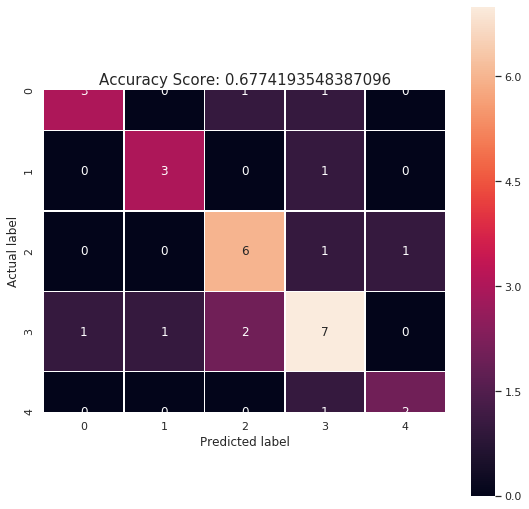

In [432]:
plt.figure(figsize=(9,9))
#sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')

#sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True)
sns.heatmap(cm, annot=True, linewidths=.5, square = True)

#sns.heatmap(cm, annot=True)
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15);

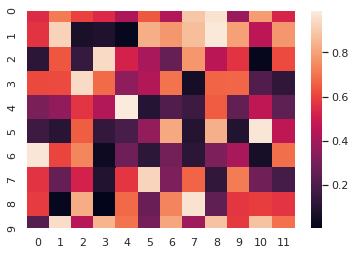

In [433]:
#import numpy as np; np.random.seed(0)
#import seaborn as sns; sns.set()
#uniform_data = np.random.rand(10, 12)
#ax = sns.heatmap(uniform_data)

## Test Set Evaluation of 300d Word2vec ##

In [ ]:
#logisticRegr.predict()

In [455]:
score_test = logisticRegr.score(test_data, test_label)

In [456]:
print(score_test)

0.8035714285714286


## Performance Accuracy on 300d Word2vec = 0.8035714285714286 ##

## Using 300d GloVe embeddings (trained on wikipedia) ##

In [470]:
from gensim.models import KeyedVectors

model_3_test = Word2Vec(size=300, min_count=1)
model_3_test.build_vocab(test_sentenceVec)
total_examples = model_3_test.corpus_count
model = KeyedVectors.load_word2vec_format("glove.6B.300d.txt", binary=False)
model_3_test.build_vocab([list(model.vocab.keys())], update=True)
model_3_test.intersect_word2vec_format("glove.6B.300d.txt", binary=False, lockf=1.0)
model_3_test.train(sentenceVec, total_examples=total_examples, epochs=model_3.iter)



/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:9: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).
  if __name__ == '__main__':


(1620, 3125)

In [458]:
from gensim.models import KeyedVectors

model_3 = Word2Vec(size=300, min_count=1)
model_3.build_vocab(sentenceVec)
total_examples = model_3.corpus_count
model = KeyedVectors.load_word2vec_format("glove.6B.300d.txt", binary=False)
model_3.build_vocab([list(model.vocab.keys())], update=True)
model_3.intersect_word2vec_format("glove.6B.300d.txt", binary=False, lockf=1.0)
model_3.train(sentenceVec, total_examples=total_examples, epochs=model_3.iter)



/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:9: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).
  if __name__ == '__main__':


(2456, 3125)

/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


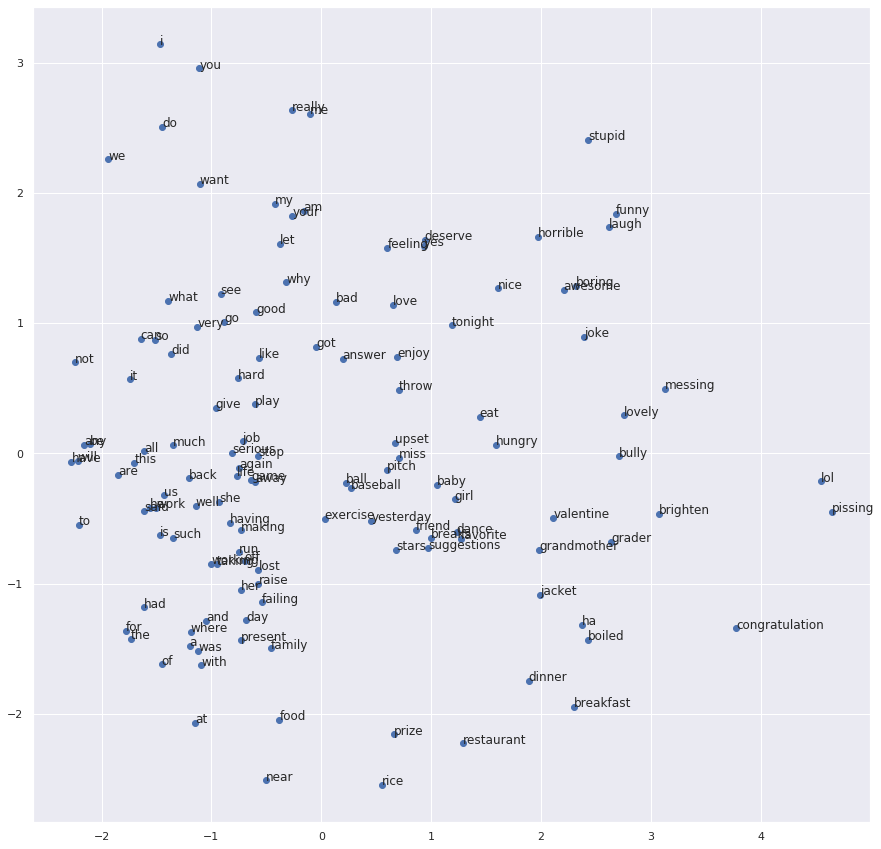

In [473]:
pyplot.figure(figsize=(15,15))
# fit a 2d PCA model to the vectors
X = model_3_test[model_1_test.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)
# create a scatter plot of the projection
pyplot.scatter(result[:, 0], result[:, 1])
words = list(model_1_test.wv.vocab)
for i, word in enumerate(words):
    pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


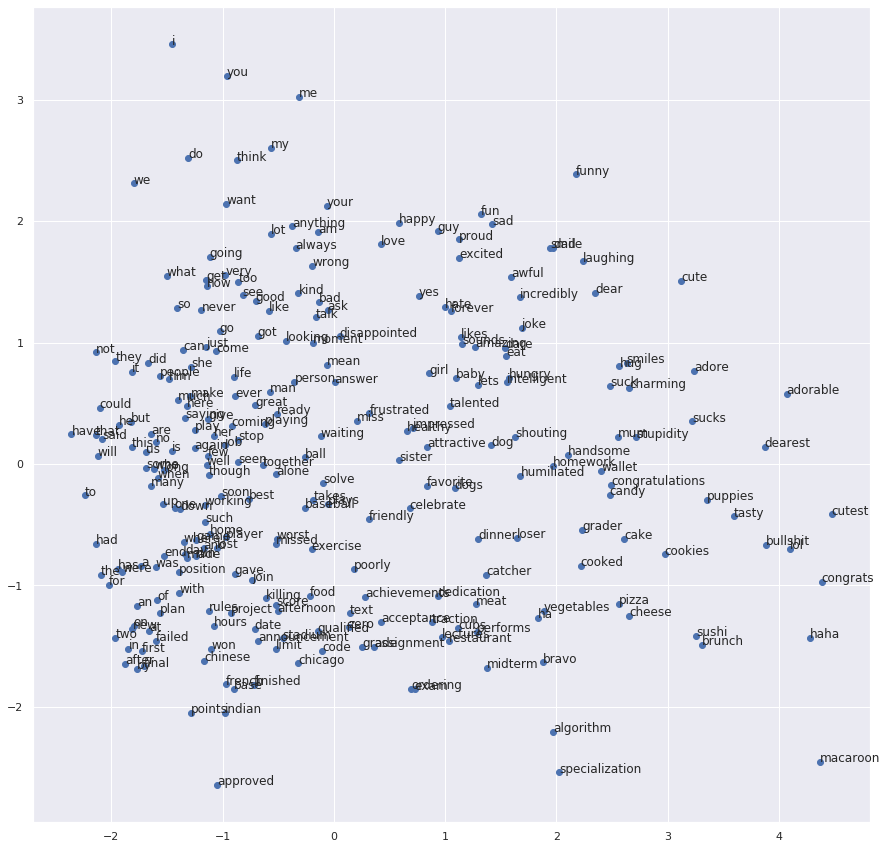

In [459]:
pyplot.figure(figsize=(15,15))
# fit a 2d PCA model to the vectors
X = model_3[model_1.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)
# create a scatter plot of the projection
pyplot.scatter(result[:, 0], result[:, 1])
words = list(model_1.wv.vocab)
for i, word in enumerate(words):
    pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

In [474]:
model_3_test.wv.vectors.shape

(338, 300)

In [460]:
model_3.wv.vectors.shape

(438, 300)

In [475]:
x_test = x_data(test_sentenceVec, model_3_test)

In [461]:
x_train = x_data(sentenceVec, model_3)

In [476]:
avg_test = dict()
for i, x_t in enumerate(x_test):
    avg_test[i] = []
    avg_test[i].append(np.mean(x_t, axis=0))

In [462]:
avg_train = dict()
for i, x_t in enumerate(x_train):
    avg_train[i] = []
    avg_train[i].append(np.mean(x_t, axis=0))

In [463]:
len(avg_train.values())

132

In [477]:
avg_test_2 = list()
for x in avg_test.values():
    avg_test_2.append(x[0])
    #print(x[0])
    #print('++++++++++++++++++++++++++')

In [464]:
avg_train_2 = list()
for x in avg_train.values():
    avg_train_2.append(x[0])
    #print(x[0])
    #print('++++++++++++++++++++++++++')

In [478]:
test_data = np.array(avg_test_2)

In [465]:
data = np.array(avg_train_2)

In [466]:
x_train, x_test, y_train, y_test = train_test_split(data, training_label, test_size=0.23, random_state=2)

In [467]:
logisticRegr.fit(x_train, y_train)

/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [468]:
score = logisticRegr.score(x_test, y_test)

In [469]:
print(score)

0.8064516129032258


## Test Set Evaluation of 300d GloVe  ##

In [479]:
score_test = logisticRegr.score(test_data, test_label)

In [480]:
print(score_test)

0.7857142857142857


## Performance Accuracy on 300d Glove = 0.7857142857142857 ##

## Task 5 ##

## 50d GloVe embedding trained on Wikipedia ##

In [482]:
model_4 = Word2Vec(size=50, min_count=1)
model_4.build_vocab(sentenceVec)
total_examples = model_4.corpus_count
model = KeyedVectors.load_word2vec_format("glove.6B/glove.6B.50d.txt", binary=False)
model_4.build_vocab([list(model.vocab.keys())], update=True)
model_4.intersect_word2vec_format("glove.6B/glove.6B.50d.txt", binary=False, lockf=1.0)
model_4.train(sentenceVec, total_examples=total_examples, epochs=model_4.iter)



/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:7: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).
  import sys


(2456, 3125)

/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


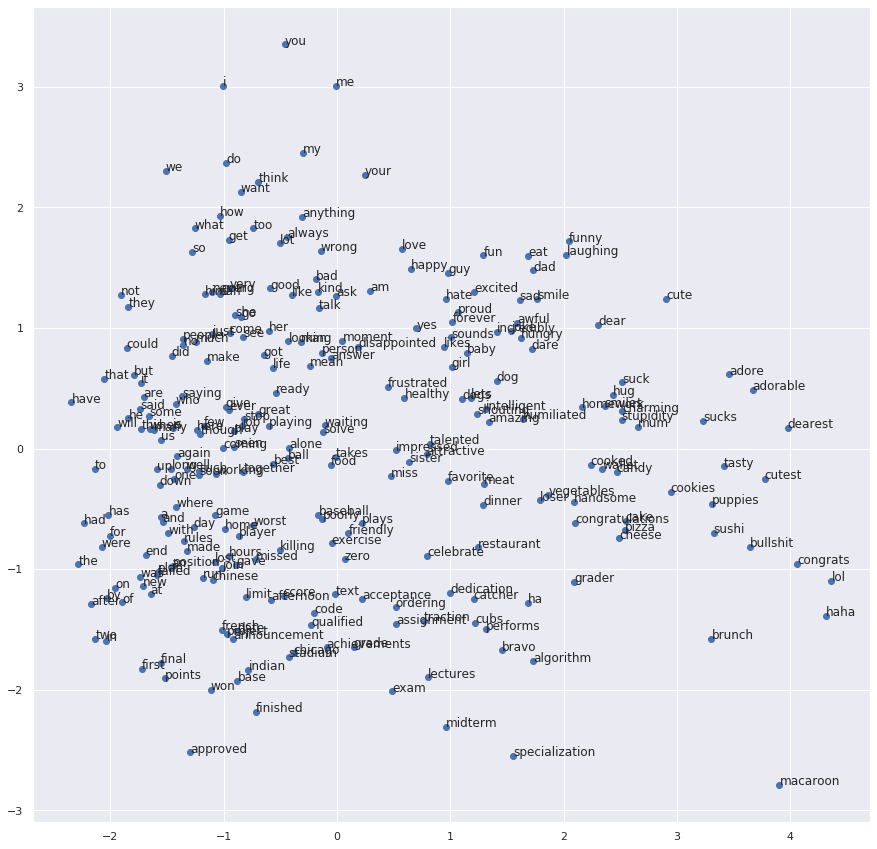

In [483]:
pyplot.figure(figsize=(15,15))
# fit a 2d PCA model to the vectors
X = model_4[model_1.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)
# create a scatter plot of the projection
pyplot.scatter(result[:, 0], result[:, 1])
words = list(model_1.wv.vocab)
for i, word in enumerate(words):
    pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

In [485]:
model_4.wv.vectors.shape

(438, 50)

In [486]:
x_train = x_data(sentenceVec, model_4)

In [487]:
avg_train = dict()
for i, x_t in enumerate(x_train):
    avg_train[i] = []
    avg_train[i].append(np.mean(x_t, axis=0))

In [488]:
avg_train_2 = list()
for x in avg_train.values():
    avg_train_2.append(x[0])
    #print(x[0])
    #print('++++++++++++++++++++++++++')

In [489]:
data = np.array(avg_train_2)

In [490]:
x_train, x_test, y_train, y_test = train_test_split(data, training_label, test_size=0.23, random_state=2)

In [491]:
logisticRegr.fit(x_train, y_train)

/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [492]:
score = logisticRegr.score(x_test, y_test)
print(score)

0.6774193548387096


## Evaluation Accuracy on 50d GloVe embedding trained on Wikipedia = 0.6774193548387096 ##

## 100d GloVe embedding trained on Wikipedia ##

In [494]:
model_5 = Word2Vec(size=100, min_count=1)
model_5.build_vocab(sentenceVec)
total_examples = model_5.corpus_count
model = KeyedVectors.load_word2vec_format("glove.6B/glove.6B.100d.txt", binary=False)
model_5.build_vocab([list(model.vocab.keys())], update=True)
model_5.intersect_word2vec_format("glove.6B/glove.6B.100d.txt", binary=False, lockf=1.0)
model_5.train(sentenceVec, total_examples=total_examples, epochs=model_5.iter)



/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:7: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).
  import sys


(2456, 3125)

/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


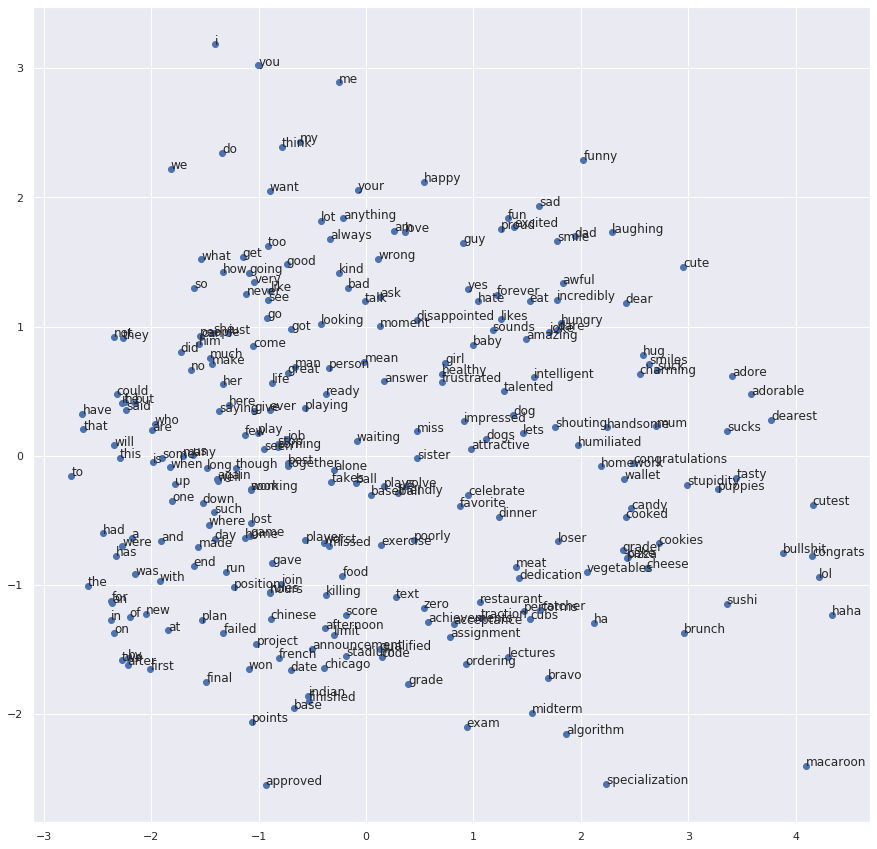

In [495]:

pyplot.figure(figsize=(15,15))
# fit a 2d PCA model to the vectors
X = model_5[model_1.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)
# create a scatter plot of the projection
pyplot.scatter(result[:, 0], result[:, 1])
words = list(model_1.wv.vocab)
for i, word in enumerate(words):
    pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

In [496]:
model_5.wv.vectors.shape

(438, 100)

In [497]:
x_train = x_data(sentenceVec, model_5)

In [498]:
avg_train = dict()
for i, x_t in enumerate(x_train):
    avg_train[i] = []
    avg_train[i].append(np.mean(x_t, axis=0))

In [499]:
avg_train_2 = list()
for x in avg_train.values():
    avg_train_2.append(x[0])

In [500]:
data = np.array(avg_train_2)

In [501]:
x_train, x_test, y_train, y_test = train_test_split(data, training_label, test_size=0.23, random_state=2)

In [502]:
logisticRegr.fit(x_train, y_train)

/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [503]:
score = logisticRegr.score(x_test, y_test)
print(score)

0.7419354838709677


## Evaluation Accuracy on 100d GloVe embedding trained on Wikipedia = 0.7419354838709677 ##

## 200d GloVe embedding trained on Wikipedia ##

In [504]:
model_6 = Word2Vec(size=200, min_count=1)
model_6.build_vocab(sentenceVec)
total_examples = model_6.corpus_count
model = KeyedVectors.load_word2vec_format("glove.6B/glove.6B.200d.txt", binary=False)
model_6.build_vocab([list(model.vocab.keys())], update=True)
model_6.intersect_word2vec_format("glove.6B/glove.6B.200d.txt", binary=False, lockf=1.0)
model_6.train(sentenceVec, total_examples=total_examples, epochs=model_6.iter)



/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:7: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).
  import sys


(2456, 3125)

/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


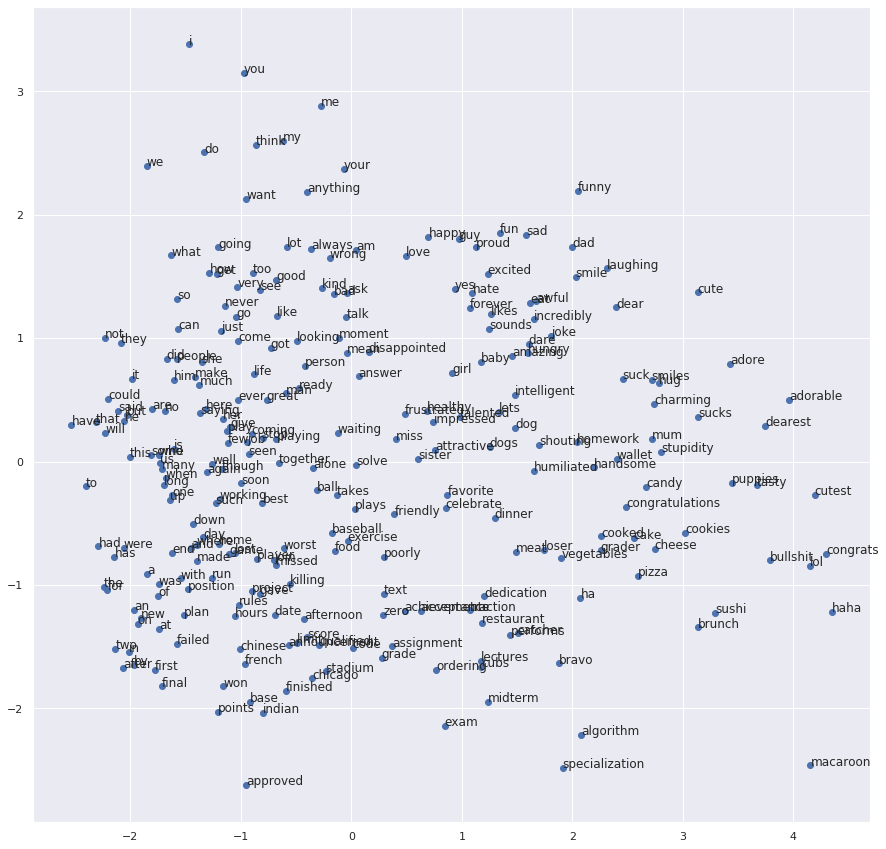

In [505]:
pyplot.figure(figsize=(15,15))
# fit a 2d PCA model to the vectors
X = model_6[model_1.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)
# create a scatter plot of the projection
pyplot.scatter(result[:, 0], result[:, 1])
words = list(model_1.wv.vocab)
for i, word in enumerate(words):
    pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

In [506]:
model_6.wv.vectors.shape

(438, 200)

In [507]:
x_train = x_data(sentenceVec, model_6)

In [508]:
avg_train = dict()
for i, x_t in enumerate(x_train):
    avg_train[i] = []
    avg_train[i].append(np.mean(x_t, axis=0))

In [509]:
avg_train_2 = list()
for x in avg_train.values():
    avg_train_2.append(x[0])

In [510]:
data = np.array(avg_train_2)

In [511]:
x_train, x_test, y_train, y_test = train_test_split(data, training_label, test_size=0.23, random_state=2)

In [512]:
logisticRegr.fit(x_train, y_train)

/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [513]:
score = logisticRegr.score(x_test, y_test)
print(score)

0.8387096774193549


## Evaluation Accuracy on 200d GloVe embedding trained on Wikipedia = 0.8387096774193549 ##

## 50d GloVe embedding trained on Twitter ##

In [514]:
model_7 = Word2Vec(size=50, min_count=1)
model_7.build_vocab(sentenceVec)
total_examples = model_7.corpus_count
model = KeyedVectors.load_word2vec_format("glove.twitter.27B/glove.twitter.27B.50d.txt", binary=False)
model_7.build_vocab([list(model.vocab.keys())], update=True)
model_7.intersect_word2vec_format("glove.twitter.27B/glove.twitter.27B.50d.txt", binary=False, lockf=1.0)
model_7.train(sentenceVec, total_examples=total_examples, epochs=model_7.iter)




/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:7: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).
  import sys


(2550, 3125)

/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


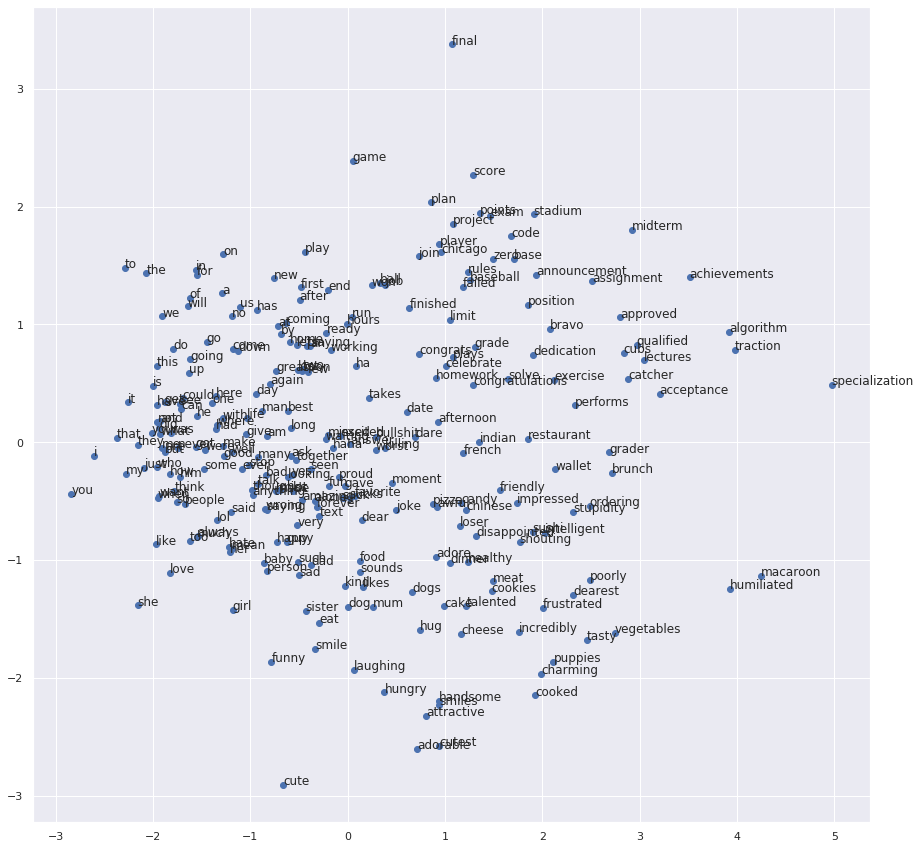

In [515]:
pyplot.figure(figsize=(15,15))
# fit a 2d PCA model to the vectors
X = model_7[model_1.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)
# create a scatter plot of the projection
pyplot.scatter(result[:, 0], result[:, 1])
words = list(model_1.wv.vocab)
for i, word in enumerate(words):
    pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

In [516]:
model_7.wv.vectors.shape

(443, 50)

In [517]:
x_train = x_data(sentenceVec, model_7)

In [518]:
avg_train = dict()
for i, x_t in enumerate(x_train):
    avg_train[i] = []
    avg_train[i].append(np.mean(x_t, axis=0))

In [519]:
avg_train_2 = list()
for x in avg_train.values():
    avg_train_2.append(x[0])

In [520]:
data = np.array(avg_train_2)

In [521]:
x_train, x_test, y_train, y_test = train_test_split(data, training_label, test_size=0.23, random_state=2)

In [522]:
logisticRegr.fit(x_train, y_train)

/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [523]:
score = logisticRegr.score(x_test, y_test)
print(score)

0.8064516129032258


## Evaluation Accuracy on 50d GloVe embedding trained on twitter = 0.8064516129032258 ##

## 100d GloVe embedding trained on Twitter ##

In [524]:
model_8 = Word2Vec(size=100, min_count=1)
model_8.build_vocab(sentenceVec)
total_examples = model_8.corpus_count
model = KeyedVectors.load_word2vec_format("glove.twitter.27B/glove.twitter.27B.100d.txt", binary=False)
model_8.build_vocab([list(model.vocab.keys())], update=True)
model_8.intersect_word2vec_format("glove.twitter.27B/glove.twitter.27B.100d.txt", binary=False, lockf=1.0)
model_8.train(sentenceVec, total_examples=total_examples, epochs=model_8.iter)




/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:7: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).
  import sys


(2550, 3125)

/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


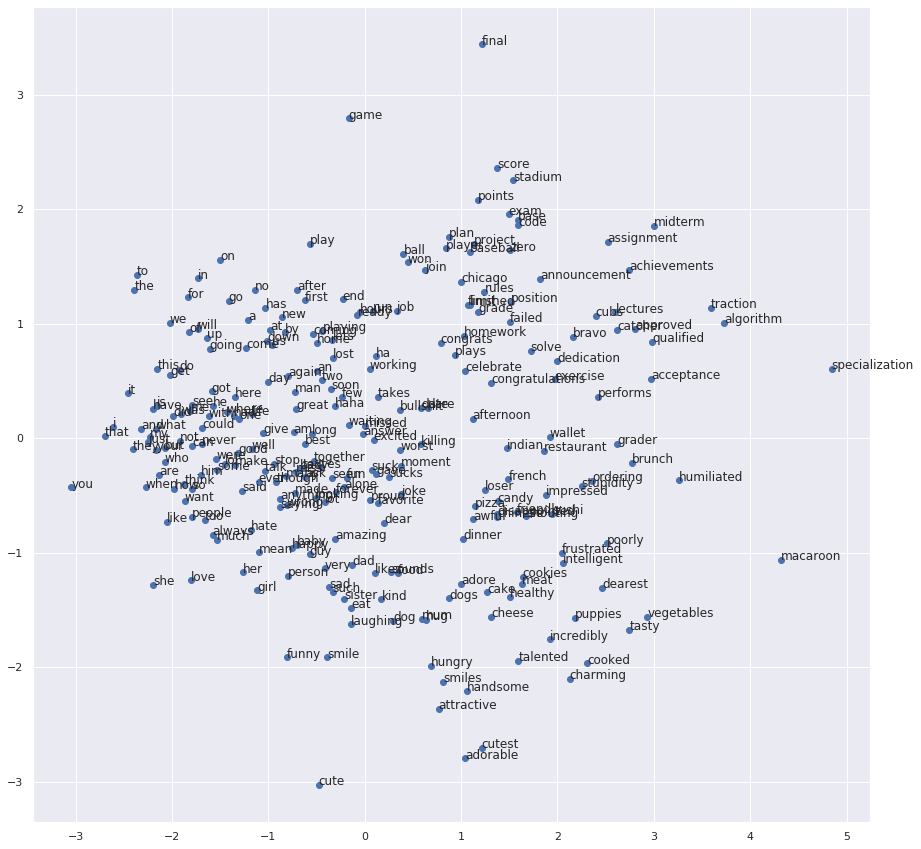

In [525]:
pyplot.figure(figsize=(15,15))
# fit a 2d PCA model to the vectors
X = model_8[model_1.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)
# create a scatter plot of the projection
pyplot.scatter(result[:, 0], result[:, 1])
words = list(model_1.wv.vocab)
for i, word in enumerate(words):
    pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

In [526]:
model_8.wv.vectors.shape

(443, 100)

In [527]:
x_train = x_data(sentenceVec, model_8)

In [528]:
avg_train = dict()
for i, x_t in enumerate(x_train):
    avg_train[i] = []
    avg_train[i].append(np.mean(x_t, axis=0))

In [529]:
avg_train_2 = list()
for x in avg_train.values():
    avg_train_2.append(x[0])

In [530]:
data = np.array(avg_train_2)

In [531]:
x_train, x_test, y_train, y_test = train_test_split(data, training_label, test_size=0.23, random_state=2)

In [532]:
logisticRegr.fit(x_train, y_train)

/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [533]:
score = logisticRegr.score(x_test, y_test)
print(score)

0.7419354838709677


## Evaluation Accuracy on 100d GloVe embedding trained on twitter = 0.7419354838709677##

## 200d GloVe embedding trained on Twitter ##

In [534]:
model_9 = Word2Vec(size=200, min_count=1)
model_9.build_vocab(sentenceVec)
total_examples = model_9.corpus_count
model = KeyedVectors.load_word2vec_format("glove.twitter.27B/glove.twitter.27B.200d.txt", binary=False)
model_9.build_vocab([list(model.vocab.keys())], update=True)
model_9.intersect_word2vec_format("glove.twitter.27B/glove.twitter.27B.200d.txt", binary=False, lockf=1.0)
model_9.train(sentenceVec, total_examples=total_examples, epochs=model_9.iter)




/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:7: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).
  import sys


(2550, 3125)

/home/demolakstate/.local/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


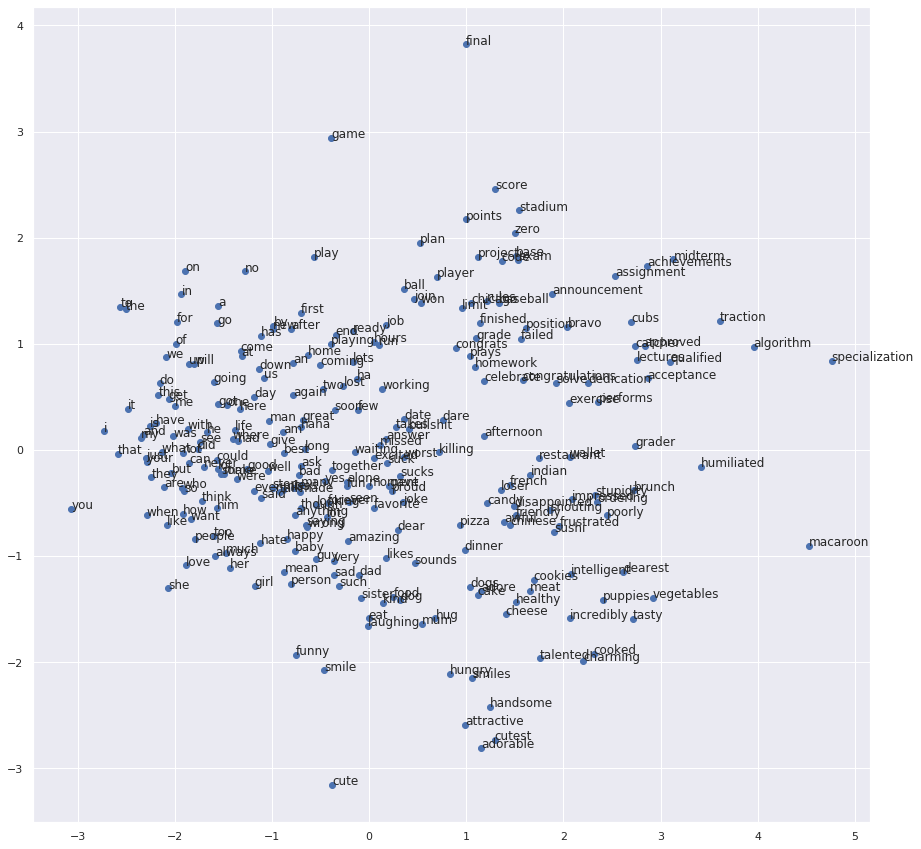

In [535]:
pyplot.figure(figsize=(15,15))
# fit a 2d PCA model to the vectors
X = model_9[model_1.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)
# create a scatter plot of the projection
pyplot.scatter(result[:, 0], result[:, 1])
words = list(model_1.wv.vocab)
for i, word in enumerate(words):
    pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

In [536]:
model_9.wv.vectors.shape

(443, 200)

In [538]:
x_train = x_data(sentenceVec, model_9)

In [539]:
avg_train = dict()
for i, x_t in enumerate(x_train):
    avg_train[i] = []
    avg_train[i].append(np.mean(x_t, axis=0))

In [540]:
avg_train_2 = list()
for x in avg_train.values():
    avg_train_2.append(x[0])

In [541]:
data = np.array(avg_train_2)

In [542]:
x_train, x_test, y_train, y_test = train_test_split(data, training_label, test_size=0.23, random_state=2)

In [543]:
logisticRegr.fit(x_train, y_train)

/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/demolakstate/anaconda3/envs/nlp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [544]:
score = logisticRegr.score(x_test, y_test)
print(score)

0.8064516129032258


## Evaluation Accuracy on 200d GloVe embedding trained on twitter = 0.8064516129032258 ##